In [151]:

import time
import pandas as pd
import glob
import numpy as np
import timeit
import pickle
import ast
from datetime import datetime
from collections import Counter
from scipy import save

import re


pd.options.mode.chained_assignment = None  # default='warn'

from multiprocessing import Pool
from matplotlib import pyplot as plt
def toc(start_time):
    elapsed = timeit.default_timer() - start_time
    print(elapsed)
start_time = timeit.default_timer()

# import matplotlib.pyplot as plt

%matplotlib inline
# %config InlineBackend.figure_format = 'svg'
plt.rcParams.update({'font.size': 8, 'font.style': 'normal', 'font.family':'serif'})
%config InlineBackend.figure_format = 'svg'
plt.rcParams.update({'font.size': 8, 'font.style': 'normal', 'font.family':'serif'})
#matplotlib.rcParams.update({'font.size': 18})

path_dicts='/mnt/sdb1/sandeep/dicts_chess/'

# with open(file_to_read) as f:
#     exec(f.read())
    
# import ast
path_='/mnt/sdb1/sandeep/0. Careers in chess/'

In [2]:
with open(path_dicts+'dict_opening_main_numeric_map.pkl', 'rb') as f:
    dict_opening_main_numeric_map= pickle.load(f)
inv_map_op={dict_opening_main_numeric_map[()][key]:key for key in dict_opening_main_numeric_map[()].keys()}

In [3]:
dict_Life_loaded={}
keys_pieces=['wP', 'wR', 'wB', 'wN', 'wQ', 'bP', 'bR', 'bB', 'bN', 'bQ'];
columns_ = ['Life','elo','opening','gametype','who_won','game_length_']

for piece_ in keys_pieces:
    dict_Life_loaded[piece_]={}
for piece_ in keys_pieces:
    for c_ in columns_:
        dict_Life_loaded[piece_][c_]=[]
s

In [4]:
#---------------------------------
# Loading saved file
#---------------------------------

#------------------------------------------------
# Saving the analysis
#------------------------------------------------
pieces_in_focus=['wB']

for piece_ in pieces_in_focus:    
    
    columns_ = ['Life','elo','opening','gametype','who_won','game_length_']
    it_col=0
    for col_ in columns_:
        print(piece_,', ',it_col, col_)
        with open(path_dicts+'dict_Lifetimes_'+piece_+'_'+str(it_col)+col_+'.pkl', 'rb') as f:
             dict_Life_loaded[piece_][col_]= pickle.load(f)
        it_col=it_col+1
    


wB ,  0 Life
wB ,  1 elo
wB ,  2 opening
wB ,  3 gametype
wB ,  4 who_won
wB ,  5 game_length_


0 :  Sicilian Defense
200000
1 :  French Defense
200000
2 :  Queen's Pawn Game
200000
3 :  Scandinavian Defense
200000
4 :  King's Pawn Game
178712


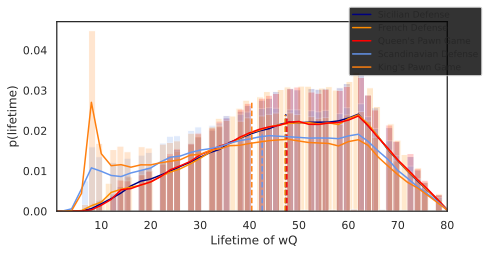

In [203]:
# from scipy import stats
# import numpy as np
# import matplotlib
# import matplotlib.pyplot as plt
# from scipy.stats import norm
# from sklearn.neighbors import KernelDensity
# from sklearn.utils.fixes import parse_version

# # `normed` is being deprecated in favor of `density` in histograms
# if parse_version(matplotlib.__version__) >= parse_version('2.1'):
#     density_param = {'density': True}
# else:
#     density_param = {'normed': True}

    
# #___________________________________________________________

# piece_='wQ'
# openings_considered=[0,1,2,3,4]
# top_n_openings=len(openings_considered)

# ELO_bins_=[1500,2800]

# # controlling for game lengths
# max_length=80
# min_length=60

# fig = plt.figure(0,figsize=(7, 3.5));
# op_labels_=[]

# #___________________________________________________________ 
# #Iterating over openings
# #___________________________________________________________
# rangec = np.linspace(0,1,top_n_openings)
# op_colors = [plt.cm.viridis(i) for i in rangec]
# op_colors = ['navy', 'darkorange','red', 'cornflowerblue','tab:orange']
# ax = fig.add_subplot(1,1,1);
# it_opening=-1
# for opening_ in openings_considered:
#     it_opening=it_opening+1

#     print(opening_,': ',inv_map_op[opening_])
#     ind_relevant=np.where((dict_Life_loaded[piece_]['opening']==opening_) & (dict_Life_loaded[piece_]['gametype']==2) \
#                          & (dict_Life_loaded[piece_]['game_length_']>min_length) & (dict_Life_loaded[piece_]['game_length_']<max_length) )

#     ind_relevant=ind_relevant[0]

#     elos_temp=dict_Life_loaded[piece_]['elo'][ind_relevant]
#     lifetimes_temp=dict_Life_loaded[piece_]['Life'][ind_relevant]


#     store_ind_for_ELO=[]
#     for it_bin in range(len(ELO_bins_)-1):
#         high_ind=np.where((elos_temp>ELO_bins_[it_bin])&(elos_temp<ELO_bins_[it_bin+1]));
#         high_ind=high_ind[0]
#         store_ind_for_ELO.append(high_ind)

#     lifetimes_to_plot=[]
#     for it_bin in range(len(ELO_bins_)-1):
#         lifetimes_to_plot.append(lifetimes_temp[store_ind_for_ELO[it_bin]])

#     #___________________________________________________________

# #     ax = fig.add_subplot(top_n_openings,1, opening_+1);


#     # filtered_game_len=np.array(filtered_game_len)

#     TOTAL_GAMES_CONSIDERED_FOR_PLOT=200000

#     rangec = np.linspace(0,1,len(ELO_bins_)-1)
#     colors = [plt.cm.viridis(i) for i in rangec]

#     labels_=[str(ELO_bins_[x])+'<ELO<'+str(ELO_bins_[x+1]) for x in range(len(ELO_bins_)-1)]

#     bins_=51
#     nn=101

#     store_for_test=[]
#     # print(ix,', ',iy, 'game lengths- ',MOVES_bins_[it_MOVES_bin],' to ',MOVES_bins_[it_MOVES_bin+1])

#     for it_bin in range(len(ELO_bins_)-1):
#     #     ind_=np.where((filtered_game_len[it_bin]>=MOVES_bins_[it_MOVES_bin]) & (filtered_game_len[it_bin]<MOVES_bins_[it_MOVES_bin+1]) & 
#     #                  (f_game_type_simplified[it_bin]==GAME_TYPE));

#         X=lifetimes_to_plot[it_bin]
#         TILL_= min(TOTAL_GAMES_CONSIDERED_FOR_PLOT,len(X))
#         # I take the number of points = TOTAL_GAMES if size X > size TOTAL_GAMES
#         X=X[0:TILL_]
#         store_for_test.append(X)
#         X=X.reshape(-1, 1)
#         print(TILL_)
# #         p_=ax.hist(X,bins_,alpha=.2,density=True,color=colors[it_bin]);
#         p_=ax.hist(X,bins_,alpha=.2,density=True,color=op_colors[it_opening]);
#         kde = KernelDensity(kernel='gaussian', bandwidth=1).fit(X)
#         s = np.arange(0,100,2) # This is the xrange
#         log_dens = kde.score_samples(s.reshape(-1,1))
# #         ax.plot(s,np.exp(log_dens),color=colors[it_bin],label=labels_[it_bin])
#         ax.plot(s,np.exp(log_dens),color=op_colors[it_opening],label=inv_map_op[opening_])
#         ax.plot([np.mean(lifetimes_to_plot[it_bin]) for it in range(11)],np.linspace(0,max(np.exp(log_dens)),11),'--',color=op_colors[it_opening])

#     ax.set_xlim([1,max_length])

#     # title_='X= '+pieces_[PIECE_ID]+', game lasted '+str(MOVES_bins_[it_MOVES_bin])+' to '+ str(MOVES_bins_[it_MOVES_bin+1])+' moves'+ '['+GAME_TYPE+']'
#     title_=inv_map_op[opening_]
#     op_labels_.append(title_)

# #     ax.set_title(title_,fontsize=8);

#     ax.set(xlabel=r" Lifetime of "+ piece_+ '', ylabel=r'p(lifetime)');

# #     for it_bin in range(len(ELO_bins_)-2):
# #         print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
# #               stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
# #     it_bin=0
# #     print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
# #               stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))


#     ax.legend(loc='upper right',fontsize=9,bbox_to_anchor=(1.1, 1.1));



# #___________________________________________________________

In [3]:
with open(path_dicts+'store_all_ELOs.pkl', 'rb') as f:
    store_all_ELOs= pickle.load(f)
with open(path_dicts+'store_game_lengths.pkl', 'rb') as f:
    store_game_lengths= pickle.load(f)
with open(path_dicts+'game_type_simplified_numeric.pkl', 'rb') as f:
    game_type_simplified_numeric= pickle.load(f)
with open(path_dicts+'list_game_had_eval.pkl', 'rb') as f:
    list_game_had_eval= pickle.load(f)
list_game_had_eval=np.array(list_game_had_eval)

with open(path_dicts+'store_career_indices.pkl', 'rb') as f:
    career_indices= pickle.load(f)


In [8]:
# ind_relevant=np.where((game_type_simplified_numeric==game_type_)&(store_all_ELOs>-1)&(list_game_had_eval==0) );
# X=store_all_ELOs[ind_relevant[0]];

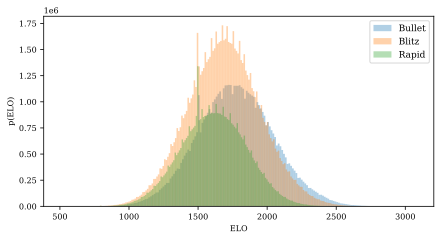

In [4]:
fig = plt.figure(0,figsize=(7, 3.5));
ax = fig.add_subplot(1,1,1);
list_types=['Bullet','Blitz','Rapid','Standard','Correspondence'];
for game_type_ in [1,2,3]:
    print(game_type_,end='\r')
    ind_relevant=np.where((game_type_simplified_numeric==game_type_)&(store_all_ELOs>-1)&(list_game_had_eval==0) );
    X=store_all_ELOs[ind_relevant[0]];
    
    
    p_=ax.hist(X,200,alpha=.35,density=False,label=list_types[game_type_-1]);
#     ax.set_yscale('log');

ax.legend(loc='upper right',fontsize=9,bbox_to_anchor=(1, 1));
ax.set(xlabel=r'ELO', ylabel=r'p(ELO)');


### game length distributions

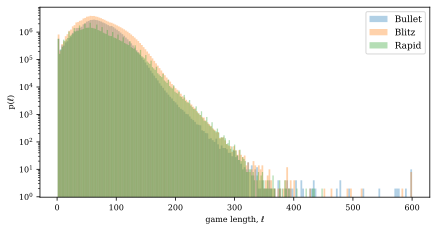

In [34]:

fig = plt.figure(0,figsize=(7, 3.5));
ax = fig.add_subplot(1,1,1);
list_types=['Bullet','Blitz','Rapid','Standard','Correspondence'];
for game_type_ in [1,2,3]:
    print(game_type_,end='\r')
    ind_relevant=np.where((game_type_simplified_numeric==game_type_)&(store_all_ELOs>-1)&(list_game_had_eval==0) );
    X=store_game_lengths[ind_relevant[0]];
    p_=ax.hist(X,200,alpha=.35,density=False,label=list_types[game_type_-1]);
    ax.set_yscale('log');

ax.legend(loc='upper right',fontsize=9,bbox_to_anchor=(1, 1));
ax.set(xlabel=r'game length, $\ell$', ylabel=r'p($\ell$)');


In [3]:
with open(path_dicts+'store_all_ELOs.pkl', 'rb') as f:
    store_all_ELOs= pickle.load(f)
with open(path_dicts+'store_game_lengths.pkl', 'rb') as f:
    store_game_lengths= pickle.load(f)
with open(path_dicts+'game_type_simplified_numeric.pkl', 'rb') as f:
    game_type_simplified_numeric= pickle.load(f)
with open(path_dicts+'list_game_had_eval.pkl', 'rb') as f:
    list_game_had_eval= pickle.load(f)
list_game_had_eval=np.array(list_game_had_eval)

with open(path_dicts+'store_career_indices.pkl', 'rb') as f:
    career_indices= pickle.load(f)

    



In [4]:
with open(path_dicts+'list_store_all_OPENINGS_main_numeric.pkl', 'rb') as f:
    store_op_mains= pickle.load(f)
with open(path_dicts+'store_is_white.pkl', 'rb') as f:
    store_is_white= pickle.load(f)
with open(path_dicts+'list_all_OPENINGS.pkl', 'rb') as f:
    list_all_OPENINGS_variations= pickle.load(f)
with open(path_dicts+'list_store_all_OPENINGS_variations_numeric.pkl', 'rb') as f:
    store_all_OPENINGS_variations= pickle.load(f)
with open(path_dicts+'dict_opening_variations_numeric_map.pkl', 'rb') as f:
    dict_opening_variations_numeric_map= pickle.load(f)
    


inv_map_op_variations={dict_opening_variations_numeric_map[key]:key for key in dict_opening_variations_numeric_map.keys()}
    

In [196]:
# career_in_focus=len(career_indices)
# t_ic = time.time();
# from collections import Counter


# entropy_1={'1':[],'2':[],'3':[]}
# entropy_2={'1':[],'2':[],'3':[]}
# entropy_1_at_500={'1':[],'2':[],'3':[]}
# entropy_2_at_500={'1':[],'2':[],'3':[]}
# entropy_1_at_1000={'1':[],'2':[],'3':[]}
# entropy_2_at_1000={'1':[],'2':[],'3':[]}

# num_op_FILTER={'1':[],'2':[],'3':[]}
# player_elo_FILTER={'1':[],'2':[],'3':[]}

# list_types=['Bullet','Blitz','Rapid','Standard','Correspondence'];

# def entropy_cal(ops_rel):

#     op_count=Counter(ops_rel)
#     op_count_=np.array(list(op_count.values()))
#     prob_=op_count_/np.sum(op_count_)
#     entropy_=-np.sum(np.multiply(prob_,np.log2(prob_)))
#     return entropy_

# for it in range(career_in_focus-1):

#     ind0=career_indices[it]+1
#     ind1=career_indices[it+1]+1
#     type_=game_type_simplified_numeric[ind0:ind1]
#     ops_=store_op_mains[ind0:ind1]
#     ops_vari=store_all_OPENINGS_variations[ind0:ind1]
#     elos_=store_all_ELOs[ind0:ind1]
#     is_white=store_is_white[ind0:ind1]

    
    
#     for game_type_ in [1,2,3]: 
#         key_=str(game_type_)
#         ind_relevant=np.where((type_==game_type_)&\
#                               (elos_>-1) & (is_white==1));

#         ops_rel=ops_[ind_relevant[0]]
#         ops_rel_vari=ops_vari[ind_relevant[0]]
#         LL_=ops_rel.shape[0]
#         num_op_FILTER[key_].append(LL_)
#         if LL_>0:

#             entropy_1[key_].append(entropy_cal(ops_rel))
#             entropy_2[key_].append(entropy_cal(ops_rel_vari))
#             if LL_>500:
#                 entropy_1_at_500[key_].append(entropy_cal(ops_rel[0:499]))
#                 entropy_2_at_500[key_].append(entropy_cal(ops_rel_vari[0:499]))
#             else:
#                 entropy_1_at_500[key_].append(-1)
#                 entropy_2_at_500[key_].append(-1)
#             if LL_>1000:
#                 entropy_1_at_1000[key_].append(entropy_cal(ops_rel[0:999]))
#                 entropy_2_at_1000[key_].append(entropy_cal(ops_rel_vari[0:999]))
#             else:
#                 entropy_1_at_1000[key_].append(-1)
#                 entropy_2_at_1000[key_].append(-1)     
#             player_elo_FILTER[key_].append(np.mean(elos_[ind_relevant]))

#         else:
#             entropy_1[key_].append(-1)
#             entropy_2[key_].append(-1)
#             player_elo_FILTER[key_].append(-1)
#             entropy_1_at_500[key_].append(-1)
#             entropy_2_at_500[key_].append(-1)
#             entropy_1_at_1000[key_].append(-1)
#             entropy_2_at_1000[key_].append(-1)  
        

    
#     if it % 10000 == 0:
#         t_oc = time.time();
#         print('career number=''--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'',end='\r')
#         with open("/mnt/sdb1/sandeep/0. Careers in chess/a_entropy_calc.txt", "a") as file_object:
#             file_object.write('--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'\n')

# #------------------------------------------------
# # Saving the analysis
# #------------------------------------------------
# player_entropy_1={x:np.array(entropy_1[x]) for x in entropy_1.keys()}
# player_entropy_2={x:np.array(entropy_2[x]) for x in entropy_2.keys()}
# player_elo_for_FILTER={x:np.array(player_elo_FILTER[x]) for x in player_elo_FILTER.keys()}
# player_num_op_FILTER={x:np.array(num_op_FILTER[x]) for x in num_op_FILTER.keys()}
# player_entropy_1_at_500={x:np.array(entropy_1_at_500[x]) for x in entropy_1_at_500.keys()}
# player_entropy_2_at_500={x:np.array(entropy_2_at_500[x]) for x in entropy_2_at_500.keys()}
# player_entropy_1_at_1000={x:np.array(entropy_1_at_1000[x]) for x in entropy_1_at_1000.keys()}
# player_entropy_2_at_1000={x:np.array(entropy_2_at_1000[x]) for x in entropy_2_at_1000.keys()}



# with open(path_dicts+'player_entropy_1.pkl', 'wb') as f:
#     pickle.dump(player_entropy_1, f)

# with open(path_dicts+'player_entropy_2.pkl', 'wb') as f:
#     pickle.dump(player_entropy_2, f)

# with open(path_dicts+'player_entropy_1_at_500.pkl', 'wb') as f:
#     pickle.dump(player_entropy_1_at_500, f)

# with open(path_dicts+'player_entropy_2_at_500.pkl', 'wb') as f:
#     pickle.dump(player_entropy_2_at_500, f)

# with open(path_dicts+'player_entropy_1_at_1000.pkl', 'wb') as f:
#     pickle.dump(player_entropy_1_at_1000, f)

# with open(path_dicts+'player_entropy_2_at_1000.pkl', 'wb') as f:
#     pickle.dump(player_entropy_2_at_1000, f)

# with open(path_dicts+'player_elo_for_FILTER.pkl', 'wb') as f:
#     pickle.dump(player_elo_for_FILTER, f)

# with open(path_dicts+'player_num_op_FILTER.pkl', 'wb') as f:
#     pickle.dump(player_num_op_FILTER, f)



In [169]:
entropy_ALL={'1':[],'2':[],'3':[]}

for game_type_ in [1,2,3]: 
    key_=str(game_type_)
    ind_relevant=np.where((game_type_simplified_numeric==game_type_)&\
                          (store_all_ELOs>-1)& (store_is_white==1) );

    ops_rel=store_op_mains[ind_relevant]
    ops_rel_vari=store_all_OPENINGS_variations[ind_relevant]
    num_op_FILTER[key_].append(LL_)
    entropy_ALL[key_].append(entropy_cal(ops_rel))
    

In [170]:
entropy_ALL

{'1': [5.864138125377055], '2': [5.849315837805676], '3': [5.798322140639]}

In [5]:
with open(path_dicts+'player_entropy_2.pkl', 'rb') as f:
    player_entropy_2= pickle.load(f)
    
with open(path_dicts+'player_entropy_1.pkl', 'rb') as f:
    player_entropy_1= pickle.load(f)
    
    
with open(path_dicts+'player_elo_for_FILTER.pkl', 'rb') as f:
    player_elo_for_FILTER= pickle.load(f)
    
with open(path_dicts+'player_num_op_FILTER.pkl', 'rb') as f:
    player_num_op_FILTER= pickle.load(f)
    
with open(path_dicts+'player_entropy_1_at_500.pkl', 'rb') as f:
    player_entropy_1_at_500= pickle.load(f)
    
with open(path_dicts+'player_entropy_2_at_500.pkl', 'rb') as f:
    player_entropy_2_at_500= pickle.load(f)
    
with open(path_dicts+'player_entropy_1_at_1000.pkl', 'rb') as f:
    player_entropy_1_at_1000= pickle.load(f)
    
with open(path_dicts+'player_entropy_2_at_1000.pkl', 'rb') as f:
    player_entropy_2_at_1000= pickle.load(f)






ELO<1394 vs 1394<ELO<1500 
 KstestResult(statistic=0.08172815350685236, pvalue=1.6702212352619654e-32)
1394<ELO<1500 vs 1500<ELO<1627 
 KstestResult(statistic=0.06308256152501124, pvalue=2.751843100260141e-20)
1500<ELO<1627 vs ELO>1627 
 KstestResult(statistic=0.09923632018360073, pvalue=5.3487956862672496e-89)
ELO<1394 vs 1500<ELO<1627 
 KstestResult(statistic=0.13710717491784663, pvalue=7.896538197814364e-108)


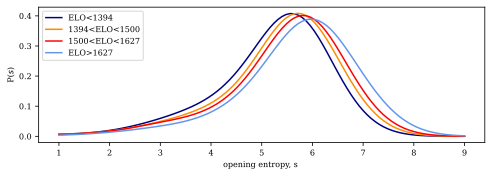

In [154]:

game_type_=2


from scipy import stats
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.neighbors import KernelDensity
from sklearn.utils.fixes import parse_version

# `normed` is being deprecated in favor of `density` in histograms
if parse_version(matplotlib.__version__) >= parse_version('2.1'):
    density_param = {'density': True}
else:
    density_param = {'normed': True}


#------------------------------------------------------
bins_=101

colors = ['navy', 'darkorange','red', 'cornflowerblue']

# ind_relevant__=np.where((game_type_simplified_numeric==game_type_)&(store_all_ELOs>-1) );
# X=store_all_ELOs[ind_relevant__[0]];
# ELO_bins_= get_ELO_bins(game_type_,X)


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=101
fig = plt.figure(0,figsize=(8, 2.5));
ax = fig.add_subplot(1, 1,1);

store_for_test=[]
LINES_=['-.','--','-']
LINES_=['-']
CAREER_LEN_bins_=[100,500,2000,10000]
CAREER_LEN_bins_=[100,10000]


labels_=[str(ELO_bins_[x])+'<ELO<'+str(ELO_bins_[x+1]) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(ELO_bins_[1])
labels_[len(labels_)-1]='ELO>'+str(ELO_bins_[len(ELO_bins_)-2])

it_career_len=0

for it_bin in range(len(ELO_bins_)-1):

    line_stlye=LINES_[it_career_len]
    high_ind=np.where((player_elo_for_FILTER[str(game_type_)]>ELO_bins_[it_bin])&\
                      (player_elo_for_FILTER[str(game_type_)]<ELO_bins_[it_bin+1])&(player_elo_for_FILTER[str(game_type_)]>-1)\
                     &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
                     &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
    high_ind=high_ind[0]
    X=player_entropy_2[str(game_type_)][high_ind]
    store_for_test.append(X)
    X=X.reshape(-1, 1)
#     p_=ax.hist(X,bins_,alpha=.3,density=True,color=colors[it_bin]);
    kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(X)
    s = np.linspace(1,9,nn)
    log_dens = kde.score_samples(s.reshape(-1,1))
    ax.plot(s,np.exp(log_dens),line_stlye,color=colors[it_bin],label=labels_[it_bin])


# ax.hist(store_entropyL[high_ind],bins_,alpha=.3,density=True);
# ax.legend(store_lines,leg_,loc=(1.04,0));
# ax.set(xlabel=r"opening entropy , s ", ylabel=r'P($s$)');

ax.set(xlabel=r"opening entropy, s ", ylabel=r'P($s$)');

for it_bin in range(len(ELO_bins_)-2):
    print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
it_bin=0
print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))

# print('12',stats.ks_2samp(store_for_test[1],store_for_test[2]))
# print('02',stats.ks_2samp(store_for_test[0],store_for_test[2]))

ax.legend(loc='upper left');


# ax = fig.add_subplot(2, 1, 2);
# ax.hist(store_rating,bins_,alpha=.3);

# ax.set_yscale('log',base=10)
# ax.set_xticks(np.linspace(12,48,4));

ELO<1375 vs 1375<ELO<1500 
 KstestResult(statistic=0.19540615977670608, pvalue=6.661338147750939e-16)
1375<ELO<1500 vs 1500<ELO<1633 
 KstestResult(statistic=0.07323232323232323, pvalue=0.7772324241486227)
1500<ELO<1633 vs ELO>1633 
 KstestResult(statistic=0.20735021975479992, pvalue=0.001048196430072701)
ELO<1375 vs 1500<ELO<1633 
 KstestResult(statistic=0.25689838664898046, pvalue=1.8444471045042654e-05)


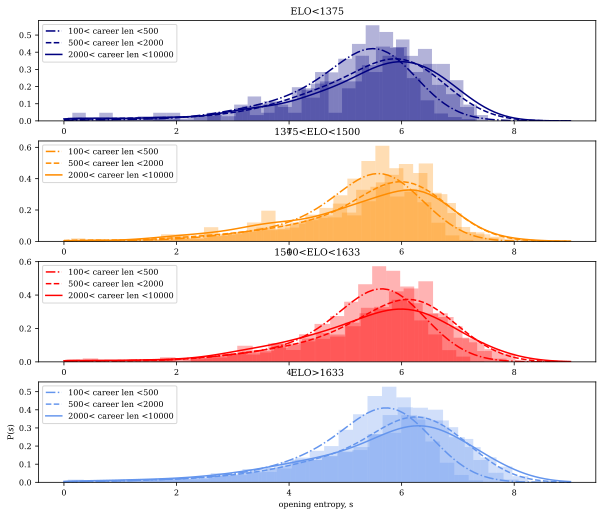

In [156]:

game_type_=1


from scipy import stats
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.neighbors import KernelDensity
from sklearn.utils.fixes import parse_version

# `normed` is being deprecated in favor of `density` in histograms
if parse_version(matplotlib.__version__) >= parse_version('2.1'):
    density_param = {'density': True}
else:
    density_param = {'normed': True}


#------------------------------------------------------
bins_=30

colors = ['navy', 'darkorange','red', 'cornflowerblue']

ind_relevant__=np.where(player_elo_for_FILTER[str(game_type_)]>-1 );
X=player_elo_for_FILTER[str(game_type_)][ind_relevant__[0]];
ELO_bins_= get_ELO_bins(game_type_,X)


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=101
fig = plt.figure(0,figsize=(10, 8.5));

store_for_test=[]
LINES_=['-.','--','-']
CAREER_LEN_bins_=[100,500,2000,10000]


labels_=[str(ELO_bins_[x])+'<ELO<'+str(ELO_bins_[x+1]) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(ELO_bins_[1])
labels_[len(labels_)-1]='ELO>'+str(ELO_bins_[len(ELO_bins_)-2])


for it_bin in range(len(ELO_bins_)-1):
    ax = fig.add_subplot(len(ELO_bins_)-1, 1, it_bin+1);

    for it_career_len in range(len(CAREER_LEN_bins_)-1):
        line_stlye=LINES_[it_career_len]
        high_ind=np.where((player_elo_for_FILTER[str(game_type_)]>ELO_bins_[it_bin])&\
                          (player_elo_for_FILTER[str(game_type_)]<ELO_bins_[it_bin+1])&(player_elo_for_FILTER[str(game_type_)]>-1)\
                         &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
                         &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
        high_ind=high_ind[0]
        X=player_entropy_2[str(game_type_)][high_ind]
        store_for_test.append(X)
        X=X.reshape(-1, 1)
        p_=ax.hist(X,bins_,alpha=.3,density=True,color=colors[it_bin]);
        kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(X)
        s = np.linspace(0,9,nn)
        log_dens = kde.score_samples(s.reshape(-1,1))
        ax.plot(s,np.exp(log_dens),line_stlye,color=colors[it_bin],label=str(CAREER_LEN_bins_[it_career_len])+\
                '< career len <'+str(CAREER_LEN_bins_[it_career_len+1]))
        ax.legend(loc='upper left');

    ax.set_title(labels_[it_bin])
# ax.hist(store_entropyL[high_ind],bins_,alpha=.3,density=True);
# ax.legend(store_lines,leg_,loc=(1.04,0));
# ax.set(xlabel=r"opening entropy , s ", ylabel=r'P($s$)');

ax.set(xlabel=r"opening entropy, s ", ylabel=r'P($s$)');

for it_bin in range(len(ELO_bins_)-2):
    print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
it_bin=0
print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))

# print('12',stats.ks_2samp(store_for_test[1],store_for_test[2]))
# print('02',stats.ks_2samp(store_for_test[0],store_for_test[2]))



# ax = fig.add_subplot(2, 1, 2);
# ax.hist(store_rating,bins_,alpha=.3);

# ax.set_yscale('log',base=10)
# ax.set_xticks(np.linspace(12,48,4));

ELO<1395 vs 1395<ELO<1500 
 KstestResult(statistic=0.19513958807004683, pvalue=9.667795030810614e-40)
1395<ELO<1500 vs 1500<ELO<1650 
 KstestResult(statistic=0.06676669167291822, pvalue=0.005240817181534862)
1500<ELO<1650 vs ELO>1650 
 KstestResult(statistic=0.08799939010609538, pvalue=3.425917449728644e-08)
ELO<1395 vs 1500<ELO<1650 
 KstestResult(statistic=0.13937227489817416, pvalue=2.0856257846778916e-20)


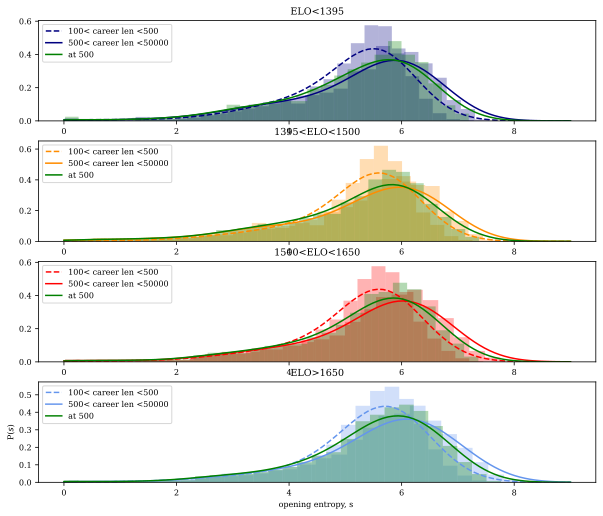

In [157]:

game_type_=3


from scipy import stats
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.neighbors import KernelDensity
from sklearn.utils.fixes import parse_version

# `normed` is being deprecated in favor of `density` in histograms
if parse_version(matplotlib.__version__) >= parse_version('2.1'):
    density_param = {'density': True}
else:
    density_param = {'normed': True}


#------------------------------------------------------
bins_=30

colors = ['navy', 'darkorange','red', 'cornflowerblue']

ind_relevant__=np.where((player_elo_for_FILTER[str(game_type_)]>-1) );
X=player_elo_for_FILTER[str(game_type_)][ind_relevant__[0]];
ELO_bins_= get_ELO_bins(game_type_,X)


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=101
fig = plt.figure(0,figsize=(10, 8.5));

store_for_test=[]
LINES_=['--','-']
CAREER_LEN_bins_=[100,500,50000]
other_curves_=1

labels_=[str(ELO_bins_[x])+'<ELO<'+str(ELO_bins_[x+1]) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(ELO_bins_[1])
labels_[len(labels_)-1]='ELO>'+str(ELO_bins_[len(ELO_bins_)-2])

list_career_len_of_bin=[]
for it_bin in range(len(ELO_bins_)-1):
    ax = fig.add_subplot(len(ELO_bins_)-1, 1, it_bin+1);

    for it_career_len in range(len(CAREER_LEN_bins_)-1+other_curves_):
        if it_career_len<len(CAREER_LEN_bins_)-1:
            line_stlye=LINES_[it_career_len]
            color__=colors[it_bin]
            label__=str(CAREER_LEN_bins_[it_career_len])+\
                '< career len <'+str(CAREER_LEN_bins_[it_career_len+1])
            high_ind=np.where((player_elo_for_FILTER[str(game_type_)]>ELO_bins_[it_bin])&\
                              (player_elo_for_FILTER[str(game_type_)]<ELO_bins_[it_bin+1])&(player_elo_for_FILTER[str(game_type_)]>-1)\
                             &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
                             &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
            high_ind=high_ind[0] 
            list_career_len_of_bin.append(np.mean(player_num_op_FILTER[str(game_type_)][high_ind]))
            X=player_entropy_2[str(game_type_)][high_ind]

        else:
            X=player_entropy_2_at_500
            line_stlye='-'
            color__='g'
            label__='at 500'
            high_ind=np.where((player_elo_for_FILTER[str(game_type_)]>ELO_bins_[it_bin])&\
                              (player_elo_for_FILTER[str(game_type_)]<ELO_bins_[it_bin+1])&\
                              (player_elo_for_FILTER[str(game_type_)]>-1)\
                              &(X[str(game_type_)]>-1));
            high_ind=high_ind[0] 
            X=X[str(game_type_)][high_ind]
        
        
        store_for_test.append(X)
        X=X.reshape(-1, 1)
        p_=ax.hist(X,bins_,alpha=.3,density=True,color=color__);
        kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(X)
        s = np.linspace(0,9,nn)
        log_dens = kde.score_samples(s.reshape(-1,1))
        ax.plot(s,np.exp(log_dens),line_stlye,color=color__,label=label__)
        ax.legend(loc='upper left');

    ax.set_title(labels_[it_bin])
# ax.hist(store_entropyL[high_ind],bins_,alpha=.3,density=True);
# ax.legend(store_lines,leg_,loc=(1.04,0));
# ax.set(xlabel=r"opening entropy , s ", ylabel=r'P($s$)');

ax.set(xlabel=r"opening entropy, s ", ylabel=r'P($s$)');

for it_bin in range(len(ELO_bins_)-2):
    print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
it_bin=0
print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))

# print('12',stats.ks_2samp(store_for_test[1],store_for_test[2]))
# print('02',stats.ks_2samp(store_for_test[0],store_for_test[2]))



# ax = fig.add_subplot(2, 1, 2);
# ax.hist(store_rating,bins_,alpha=.3);

# ax.set_yscale('log',base=10)
# ax.set_xticks(np.linspace(12,48,4));

### Survival curves: Career Length vs ELO

In [204]:
# career_indices=np.array(career_indices)
# career_lens=career_indices[1:len(career_indices)]-career_indices[0:len(career_indices)-1]
# career_in_focus=len(career_indices)
   
# t_ic = time.time();

# career_lens_vs_type={'1':[],'2':[],'3':[]};
# player_elo_FILTER={'1':[],'2':[],'3':[]};

# for it in range(career_in_focus-1):
#     ind0=career_indices[it]+1
#     ind1=career_indices[it+1]+1
#     type_=game_type_simplified_numeric[ind0:ind1]
#     elos_=store_all_ELOs[ind0:ind1]
    
#     for game_type_ in [1,2,3]: 
#         key_=str(game_type_)    
        
#         ind_relevant=np.where((type_==game_type_)&(elos_>-1) );
#         ind_relevant=ind_relevant[0]
#         LL_=ind_relevant.shape[0]
        
#         if LL_>0:
#             career_lens_vs_type[key_].append(LL_)
#             player_elo_FILTER[key_].append(np.mean(elos_[ind_relevant]))
#         else:
#             career_lens_vs_type[key_].append(-1)
#             player_elo_FILTER[key_].append(-1)


#         if it % 20000 == 0:
#             t_oc = time.time();
#             print('career number=''--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'',end='\r')
#             with open("/mnt/sdb1/sandeep/0. Careers in chess/a_entropy_calc.txt", "a") as file_object:
#                 file_object.write('--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'\n')

# #------------------------------------------------
# # Saving the analysis
# #------------------------------------------------
# career_lens_vs_type_survival={x:np.array(career_lens_vs_type[x]) for x in career_lens_vs_type.keys()}
# player_elo_for_FILTER_survival={x:np.array(player_elo_FILTER[x]) for x in player_elo_FILTER.keys()}



# with open(path_dicts+'career_lens_vs_type_survival.pkl', 'wb') as f:
#     pickle.dump(career_lens_vs_type_survival, f)       
# with open(path_dicts+'player_elo_for_FILTER_survival.pkl', 'wb') as f:
#     pickle.dump(player_elo_for_FILTER_survival, f)       




In [130]:
with open(path_dicts+'career_lens_vs_type_survival.pkl', 'rb') as f:
    career_lens_vs_type_survival= pickle.load(f)
    
with open(path_dicts+'player_elo_for_FILTER_survival.pkl', 'rb') as f:
    player_elo_for_FILTER_survival= pickle.load(f)

In [131]:
fig = plt.figure(0,figsize=(10, 2));
list_types=['Bullet','Blitz','Rapid','Standard','Correspondence'];

for xxx in ['1','2','3']:
    ax = fig.add_subplot(1, 3, int(xxx));

    
    X=10000
    ind_rel=np.where((player_elo_for_FILTER_survival[xxx]>-1)& (career_lens_vs_type_survival[xxx]>-1))
    ind_rel=ind_rel[0]
    ax.plot(player_elo_for_FILTER_survival[xxx][ind_rel][0:X],career_lens_vs_type_survival[xxx][ind_rel][0:X],'.',alpha=.1);
    # ax.set_xscale('log')
    ax.set_yscale('log')

    # print(stats.ks_2samp(player_elo_for_FILTER_survival[xxx][ind_rel],career_lens_vs_type_survival[xxx][ind_rel]))
    rho,pval=stats.spearmanr(player_elo_for_FILTER_survival[xxx][ind_rel],career_lens_vs_type_survival[xxx][ind_rel])
    # print(r'spearman $\rho, p-val=$')
    # print(rho,pval)
    ax.set_xlabel('Player elo');
    ax.set_ylabel('Career Length');
    ax.set_title(list_types[int(xxx)-1]+', rho,pval='+str(round(rho,3))+', '+str(pval));





In [145]:

def get_ELO_bins(game_type_,X):
    
    sorted_X=sorted(X)

    #     a=sorted_X[int(np.floor(.01*len(sorted_X)))]
    #     b=sorted_X[int(np.floor(.99*len(sorted_X)))]
    a=0;b=len(sorted_X)-1
    bins_=np.floor(np.linspace(a,b,5))
    sorted_X=np.array(sorted_X)
    bins_=np.floor(sorted_X[bins_.astype('int')]).astype('int')
#     bins_[len(bins_)-1]=sorted_X[len(sorted_X)-1]


    return bins_


ind_relevant__=np.where(player_elo_for_FILTER_survival[str(game_type_)]>-1);
X=player_elo_for_FILTER_survival[str(game_type_)][ind_relevant__[0]];
ELO_bins_= get_ELO_bins(game_type_,X)




In [146]:
ELO_bins_

array([ 783, 1394, 1500, 1627, 2828])

ELO<1394 vs 1394<ELO<1500 
 KstestResult(statistic=0.1727, pvalue=1.3376216259387205e-130)
1394<ELO<1500 vs 1500<ELO<1627 
 KstestResult(statistic=0.0874, pvalue=1.217914171409787e-33)
1500<ELO<1627 vs ELO>1627 
 KstestResult(statistic=0.2195, pvalue=2.2599681819018855e-211)
ELO<1394 vs 1500<ELO<1627 
 KstestResult(statistic=0.0861, pvalue=1.1683879259267872e-32)


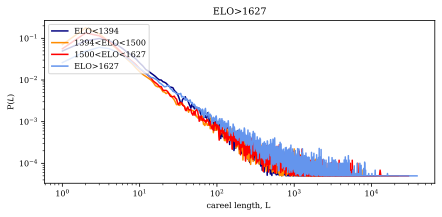

In [148]:

nn=101
fig = plt.figure(0,figsize=(7, 3));
ax = fig.add_subplot(1,1,1);
game_type_=1
store_for_test=[]
LINES_=['--','-']
CAREER_LEN_bins_=[100,500,50000]
other_curves_=1

game_type_=2

ind_relevant__=np.where(player_elo_for_FILTER_survival[str(game_type_)]>-1);
X=player_elo_for_FILTER_survival[str(game_type_)][ind_relevant__[0]];
ELO_bins_= get_ELO_bins(game_type_,X)


labels_=[str(ELO_bins_[x])+'<ELO<'+str(ELO_bins_[x+1]) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(ELO_bins_[1])
labels_[len(labels_)-1]='ELO>'+str(ELO_bins_[len(ELO_bins_)-2])

list_career_len_of_bin=[]
for it_bin in range(len(ELO_bins_)-1):

    line_stlye='-'
    color__=colors[it_bin]
    label__=labels_
    ind_rel=np.where((player_elo_for_FILTER_survival[str(game_type_)]>ELO_bins_[it_bin])&\
                      (player_elo_for_FILTER_survival[str(game_type_)]<ELO_bins_[it_bin+1])&\
                     (player_elo_for_FILTER_survival[str(game_type_)]>-1)& (career_lens_vs_type_survival[str(game_type_)]>-1))
    ind_rel=ind_rel[0]
#     ax.plot(player_elo_for_FILTER_survival[str(game_type_)][ind_rel][0:X],career_lens_vs_type_survival[str(game_type_)][ind_rel][0:X],'.',alpha=.1);
    # ax.set_xscale('log')
    
    
#     high_ind=np.where((player_elo_for_FILTER[str(game_type_)]>ELO_bins_[it_bin])&\
#                       (player_elo_for_FILTER[str(game_type_)]<ELO_bins_[it_bin+1])&(player_elo_for_FILTER[str(game_type_)]>-1)\
#                      &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
#                      &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
    X=career_lens_vs_type_survival[str(game_type_)][ind_rel][0:10000]
    store_for_test.append(X)
    X=X.reshape(-1, 1)
#     p_=ax.hist(X,101,alpha=.3,density=True,color=color__);
    kde = KernelDensity(kernel='exponential', bandwidth=1).fit(X)
#     nn=20000
    s = np.unique(X)
    log_dens = kde.score_samples(s.reshape(-1,1))
    ax.plot(s,np.exp(log_dens),'-',color=color__,label=label__[it_bin])
    ax.legend(loc='upper left');
    ax.set_yscale('log')
    ax.set_xscale('log')

#     ax.set_title(labels_[it_bin])
# ax.hist(store_entropyL[high_ind],bins_,alpha=.3,density=True);
# ax.legend(store_lines,leg_,loc=(1.04,0));
# ax.set(xlabel=r"opening entropy , s ", ylabel=r'P($s$)');

ax.set(xlabel=r"careel length, L ", ylabel=r'P($L$)');

for it_bin in range(len(ELO_bins_)-2):
    print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
it_bin=0
print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))



# Suboptimal opening stratergy
_____________________________________________________
## Top 3 frequent openings vs win rates (as white) without first 100 games

In [189]:
# career_in_focus=len(career_indices)

# t_ic = time.time();
# from collections import Counter


# with open(path_dicts+'game_won_.pkl', 'rb') as f:
#     store_who_won_= pickle.load(f)
# store_who_won_=np.array(store_who_won_)

# def winrate_cal(ops_rel):

#     op_count=Counter(ops_rel)
#     op_count_=np.array(list(op_count.values()))
    
#     prob_=op_count_/np.sum(op_count_)
#     winrate_=-np.sum(np.multiply(prob_,np.log2(prob_)))
#     return winrate_

# #----------------------------------------------
# #----------------------------------------------
# player_op_wins_suboptimal={'1':[],'2':[],'3':[]}
# player_op_counts_suboptimal={'1':[],'2':[],'3':[]}
# # num_op_FILTER_suboptimal={'1':[],'2':[],'3':[]}
# player_elo_FILTER_suboptimal={'1':[],'2':[],'3':[]}

# list_types=['Bullet','Blitz','Rapid','Standard','Correspondence'];


# for it in range(career_in_focus-1):

#     ind0=career_indices[it]+1
#     ind1=career_indices[it+1]+1
#     type_=game_type_simplified_numeric[ind0:ind1]
#     ops_=store_op_mains[ind0:ind1]
#     ops_vari=store_all_OPENINGS_variations[ind0:ind1]
#     elos_=store_all_ELOs[ind0:ind1]
#     is_white=store_is_white[ind0:ind1]
#     won_=store_who_won_[ind0:ind1]

    
#     for game_type_ in [1,2,3]:         
#         key_=str(game_type_)
#         ind_relevant=np.where((type_==game_type_)&(elos_>-1) & (is_white==1));
#         ops_rel=ops_[ind_relevant[0]]
#         # ops_rel_vari=ops_vari[ind_relevant[0]]
#         op_count=Counter(ops_rel)
       
#         LL_=ind_relevant[0].shape[0]
#         op_count______temp=op_count
#         if LL_>0:
#             op_count=op_count.most_common()
#             player_op_counts_suboptimal[key_].append(op_count)
            
            
#             player_elo_FILTER_suboptimal[key_].append(np.mean(elos_[ind_relevant]))
#             ind_relevant=np.where((type_==game_type_)&(elos_>-1) & (is_white==1) & (won_==1));
#             ops_rel=ops_[ind_relevant[0]]
#             op_wins=Counter(ops_rel)
            
#             player_op_wins_suboptimal[key_].append(op_wins)
            

#         else:
#             player_op_wins_suboptimal[key_].append(-1)
#             player_elo_FILTER_suboptimal[key_].append(-1)
#             player_op_counts_suboptimal[key_].append(-1)
   

#     if it % 10000 == 0:
#         t_oc = time.time();
#         print('career number=''--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'',end='\r')
#         with open("/mnt/sdb1/sandeep/0. Careers in chess/a_entropy_calc.txt", "a") as file_object:
#             file_object.write('--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'\n')


            

# #------------------------------------------------
# # Saving the analysis
# #------------------------------------------------
# player_elo_FILTER_suboptimal={x:np.array(player_elo_FILTER_suboptimal[x]) for x in player_elo_FILTER_suboptimal.keys()}

# with open(path_dicts+'player_op_wins_suboptimal.pkl', 'wb') as f:
#     pickle.dump(player_op_wins_suboptimal, f)

# with open(path_dicts+'player_op_counts_suboptimal.pkl', 'wb') as f:
#     pickle.dump(player_op_counts_suboptimal, f)

# with open(path_dicts+'player_elo_FILTER_suboptimal.pkl', 'wb') as f:
#     pickle.dump(player_elo_FILTER_suboptimal, f)

# # 


In [ ]:
with open(path_dicts+'player_op_wins_suboptimal.pkl', 'rb') as f:
    player_op_wins_suboptimal= pickle.load(f)
    
with open(path_dicts+'player_op_counts_suboptimal.pkl', 'rb') as f:
    player_op_counts_suboptimal= pickle.load(f)
    
with open(path_dicts+'player_elo_FILTER_suboptimal.pkl', 'rb') as f:
    player_elo_FILTER_suboptimal= pickle.load(f)
    


In [190]:
t_ic = time.time();

career_in_focus=len(career_indices)
player_op_w_suboptimal={'1':{'op1':[],'op2':[]},'2':{'op1':[],'op2':[]},'3':{'op1':[],'op2':[]}}
player_op_c_suboptimal={'1':{'op1':[],'op2':[]},'2':{'op1':[],'op2':[]},'3':{'op1':[],'op2':[]}}
for it in range(career_in_focus-1):

    for game_type_ in [1,2,3]:         
        g_type_=str(game_type_)

        openings_=player_op_counts_suboptimal[g_type_][it]

        if openings_==-1:
            player_op_w_suboptimal[g_type_]['op'+str(1)].append(-1)
            player_op_w_suboptimal[g_type_]['op'+str(2)].append(-1)
            player_op_c_suboptimal[g_type_]['op'+str(1)].append(-1)
            player_op_c_suboptimal[g_type_]['op'+str(2)].append(-1)

        else:
            
            openings_keys=[x[0] for x in openings_]
            openings_count=[x[1] for x in openings_]
            if len(openings_keys)>=2:
                for op__ in range(0,2):

                    player_total_games=openings_count[op__]


                    if op__ in player_op_wins_suboptimal[g_type_][it].keys():
                        player_wins=player_op_wins_suboptimal[g_type_][it][openings_keys[op__]]
                    else:
                        player_wins=-1
                        

                    player_op_w_suboptimal[g_type_]['op'+str(op__+1)].append(player_wins)
                    player_op_c_suboptimal[g_type_]['op'+str(op__+1)].append(player_total_games)
                    

            else:
                player_op_w_suboptimal[g_type_]['op'+str(1)].append(-1)
                player_op_w_suboptimal[g_type_]['op'+str(2)].append(-1)
                player_op_c_suboptimal[g_type_]['op'+str(1)].append(-1)
                player_op_c_suboptimal[g_type_]['op'+str(2)].append(-1)


    if it % 50000 == 0:
        t_oc = time.time();
        print('career number=''--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'',end='\r')
        with open("/mnt/sdb1/sandeep/0. Careers in chess/a_entropy_calc.txt", "a") as file_object:
            file_object.write('--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'\n')


###### making np arrays from lists
for game_type_ in [1,2,3]:         
    g_type_=str(game_type_)
    player_op_w_suboptimal[g_type_]['op'+str(1)]=np.array(player_op_w_suboptimal[g_type_]['op'+str(1)])
    player_op_w_suboptimal[g_type_]['op'+str(2)]=np.array(player_op_w_suboptimal[g_type_]['op'+str(2)])
    player_op_c_suboptimal[g_type_]['op'+str(1)]=np.array(player_op_c_suboptimal[g_type_]['op'+str(1)])
    player_op_c_suboptimal[g_type_]['op'+str(2)]=np.array(player_op_c_suboptimal[g_type_]['op'+str(2)])



In [268]:
winrates={'1':{'op1':[],'op2':[]},'2':{'op1':[],'op2':[]},'3':{'op1':[],'op2':[]}}
frac_diff2and1={'1':[],'2':[],'3':[]}
WINRATE_DIFF={'1':[],'2':[],'3':[]}

for game_type_ in [1,2,3]:
    
    g_type_=str(game_type_)
    for it_op__ in range(1,3):
        winrates[g_type_]['op'+str(it_op__)]=np.divide(player_op_w_suboptimal[g_type_]['op'+str(it_op__)],player_op_c_suboptimal[g_type_]['op'+str(it_op__)])
    

    frac_diff2and1[g_type_]=np.divide((player_op_c_suboptimal[g_type_]['op'+str(1)] -\
                             player_op_c_suboptimal[g_type_]['op'+str(2)]),\
                            player_op_c_suboptimal[g_type_]['op'+str(1)])
    
#     WINRATE_DIFF[g_type_]=np.divide((winrates[g_type_]['op'+str(1)] -\
#                              winrates[g_type_]['op'+str(2)]),\
#                             winrates[g_type_]['op'+str(1)])
    
    WINRATE_DIFF[g_type_]=(winrates[g_type_]['op'+str(1)] -\
                             winrates[g_type_]['op'+str(2)])
# ind_s=np.where((frac_diff2and1>.1)&(store_op_counts_[:,2]>100))
# ind_s=ind_s[0]
# WINRATES_=winrates[ind_s,1]-winrates[ind_s,2]


In [245]:
# # player_op_w_suboptimal[g_type_]['op'+str(it_op__)].shape
# ind_s=np.where((frac_diff2and1[g_type_]>.1)\
#               &(player_op_c_suboptimal[g_type_]['op'+str(1)]>100))

# winrates[g_type_]['op1'][ind_s]

# ind_s=np.where((frac_diff2and1[g_type_]>.1)\
#               &(player_op_c_suboptimal[g_type_]['op'+str(2)]>100))

# winrates[g_type_]['op2'][ind_s]




# ind_s=np.where((frac_diff2and1[g_type_]>.1)\
#               &(player_op_c_suboptimal[g_type_]['op'+str(1)]>100)\
#               &(player_op_c_suboptimal[g_type_]['op'+str(2)]>100))

# frac_diff2and1[g_type_][ind_s]

In [7]:
game_type_=2
ind_relevant__=np.where(player_elo_FILTER_suboptimal[str(game_type_)]>-1);
X=player_elo_FILTER_suboptimal[str(game_type_)][ind_relevant__[0]];
ELO_bins_= get_ELO_bins(game_type_,X)



NameError: name 'player_elo_FILTER_suboptimal' is not defined

In [8]:
from scipy import stats
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.neighbors import KernelDensity
from sklearn.utils.fixes import parse_version

# `normed` is being deprecated in favor of `density` in histograms
if parse_version(matplotlib.__version__) >= parse_version('2.1'):
    density_param = {'density': True}
else:
    density_param = {'normed': True}

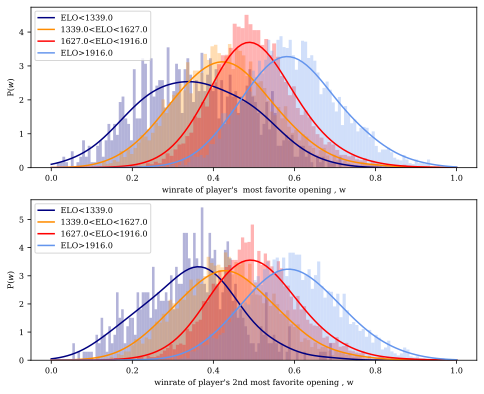

In [293]:

#------------------------------------------------------
bins_=101
op_considered=1

colors = ['navy', 'darkorange','red', 'cornflowerblue']


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=bins_
fig = plt.figure(0,figsize=(8, 6.5));

store_for_test=[]
LINES_=['-.','--','-']
LINES_=['-']
# CAREER_LEN_bins_=[100,500,2000,10000]
# CAREER_LEN_bins_=[100,10000]


labels_=[str(round(ELO_bins_[x],0))+'<ELO<'+str(round(ELO_bins_[x+1],0)) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(round(ELO_bins_[1],0))
labels_[len(labels_)-1]='ELO>'+str(round(ELO_bins_[len(ELO_bins_)-2],0))

it_career_len=0

op_considered_lab=['','2nd']
for op_considered in [1,2]:    
    ax = fig.add_subplot(2, 1,op_considered);

    for it_bin in range(len(ELO_bins_)-1):

        line_stlye=LINES_[it_career_len]
        high_ind=np.where((player_elo_FILTER_suboptimal[str(game_type_)]>ELO_bins_[it_bin])\
                          &(player_elo_FILTER_suboptimal[str(game_type_)]<ELO_bins_[it_bin+1])\
                          &(player_elo_FILTER_suboptimal[str(game_type_)]>-1)\
                          &(player_op_c_suboptimal[str(game_type_)]['op'+str(op_considered)]>50)\
                          &(player_op_w_suboptimal[str(game_type_)]['op'+str(op_considered)]>-1))
    #                       &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
    #                       &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
        high_ind=high_ind[0]
        X=winrates[str(game_type_)]['op'+str(op_considered)][high_ind]
        store_for_test.append(X)
        X=X.reshape(-1, 1)
#         print(len(X))
        p_=ax.hist(X,bins_,alpha=.3,density=True,color=colors[it_bin]);
        kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(X)
        s = np.linspace(0,1,nn)
        log_dens = kde.score_samples(s.reshape(-1,1))
        ax.plot(s,np.exp(log_dens),line_stlye,color=colors[it_bin],label=labels_[it_bin])


    ax.set(xlabel=r"winrate of player's "\
           +str(op_considered_lab[op_considered-1])+' most favorite opening , w', ylabel=r'P($w$)');

    # for it_bin in range(len(ELO_bins_)-2):
    #     print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
    #           stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
    # it_bin=0
    # print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
    #           stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))

    ax.legend(loc='upper left');



# Winrate op1 vs op2

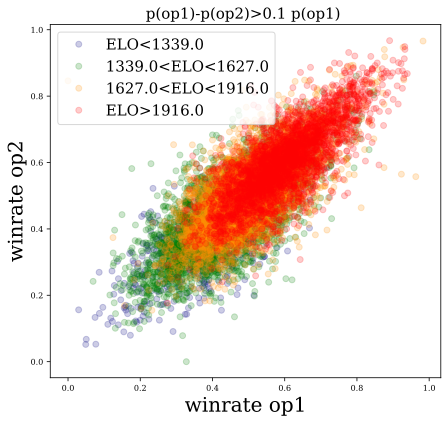

In [325]:

#------------------------------------------------------
bins_=101
op_considered=1

colors = ['navy','green', 'darkorange','red']


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=bins_
fig = plt.figure(0,figsize=(7, 6.5));

store_for_test=[]
LINES_=['-.','--','-']
LINES_=['-']
# CAREER_LEN_bins_=[100,500,2000,10000]
# CAREER_LEN_bins_=[100,10000]


labels_=[str(round(ELO_bins_[x],0))+'<ELO<'+str(round(ELO_bins_[x+1],0)) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(round(ELO_bins_[1],0))
labels_[len(labels_)-1]='ELO>'+str(round(ELO_bins_[len(ELO_bins_)-2],0))

it_career_len=0

op_considered_lab=['','2nd']
ax = fig.add_subplot(1, 1,1);


for it_bin in range(len(ELO_bins_)-1):

    line_stlye=LINES_[it_career_len]
    high_ind=np.where((player_elo_FILTER_suboptimal[str(game_type_)]>ELO_bins_[it_bin])\
                          &(player_elo_FILTER_suboptimal[str(game_type_)]<ELO_bins_[it_bin+1])\
                      &(player_elo_FILTER_suboptimal[str(game_type_)]>-1)\
                              &(player_op_c_suboptimal[str(game_type_)]['op'+str(1)]>50)\
                              &(player_op_c_suboptimal[str(game_type_)]['op'+str(2)]>50)\
                              &(player_op_w_suboptimal[str(game_type_)]['op'+str(1)]>-1)
                             &(player_op_w_suboptimal[str(game_type_)]['op'+str(2)]>-1)\
                     &(frac_diff2and1[str(game_type_)]>=.05))
        #                       &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
        #                       &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
    high_ind=high_ind[0]
    X=winrates[str(game_type_)]['op'+str(1)][high_ind]
    Y=winrates[str(game_type_)]['op'+str(2)][high_ind]
    store_for_test.append(X)
    X=X.reshape(-1, 1)
    Y=Y.reshape(-1, 1)
    #         print(len(X))
    p_=ax.plot(X,Y,'o',color=colors[it_bin],alpha=.2,label=labels_[it_bin]);


ax.set_xlabel(r"winrate op1",fontsize=20);
ax.set_ylabel(r"winrate op2",fontsize=20);
ax.set_title(r"p(op1)-p(op2)>0.1 p(op1) ",fontsize=15);


ax.legend(loc='upper left',fontsize=15);



In [350]:

#------------------------------------------------------
bins_=101

colors = ['navy', 'darkorange','red', 'cornflowerblue']


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=bins_
fig = plt.figure(0,figsize=(7, 7.5));

store_for_test=[]
LINES_=['-.','--','-']
LINES_=['-']
CAREER_LEN_bins_=[200,2000,15000]
# CAREER_LEN_bins_=[100,10000]


labels_=[str(round(ELO_bins_[x],0))+'<ELO<'+str(round(ELO_bins_[x+1],0)) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(round(ELO_bins_[1],0))
labels_[len(labels_)-1]='ELO>'+str(round(ELO_bins_[len(ELO_bins_)-2],0))

it_career_len=0

# ax = fig.add_subplot(1, 1,1);
op_considered=1
for it_bin in range(len(ELO_bins_)-1):
    ax = fig.add_subplot(len(ELO_bins_)-1, 1, it_bin+1);


    line_stlye=LINES_[it_career_len]
    
    high_ind=np.where((player_elo_FILTER_suboptimal[str(game_type_)]>ELO_bins_[it_bin])\
                      &(player_elo_FILTER_suboptimal[str(game_type_)]<ELO_bins_[it_bin+1])\
                      &(player_elo_FILTER_suboptimal[str(game_type_)]>-1)\
                      &(player_op_c_suboptimal[str(game_type_)]['op'+str(op_considered)]>50)\
                      &(player_op_w_suboptimal[str(game_type_)]['op'+str(op_considered)]>-1))

    high_ind=high_ind[0]
    Y=winrates[str(game_type_)]['op'+str(op_considered)][high_ind]
    X=player_num_op_FILTER[str(game_type_)][high_ind]
    store_for_test.append(X)
    X=X.reshape(-1, 1)
    Y=Y.reshape(-1, 1)
    p_=ax.plot(X,Y,'o',color=colors[it_bin],alpha=.2,label=labels_[it_bin]);
#     ax.set_yscale('log');
    ax.set_xscale('log');
#     ax.set_ylim([-.3,.3]);
    ax.legend(loc='upper left');

    
# ax.set(ylabel=r' , w', xlabel=r'career length');

ax.set_xlabel(r"career length",fontsize=15);
ax.set_ylabel(r"winrate("+str(op_considered)+")",fontsize=15);


    

for it_bin in range(len(ELO_bins_)-2):
    print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
it_bin=0
print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))




ELO<1339.0 vs 1339.0<ELO<1627.0 
 KstestResult(statistic=0.1802709929920683, pvalue=3.4416913763379853e-15)
1339.0<ELO<1627.0 vs 1627.0<ELO<1916.0 
 KstestResult(statistic=0.10387120832587454, pvalue=7.771561172376096e-16)
1627.0<ELO<1916.0 vs ELO>1916.0 
 KstestResult(statistic=0.018130885627175186, pvalue=0.2908898096613468)
ELO<1339.0 vs 1627.0<ELO<1916.0 
 KstestResult(statistic=0.267786141671492, pvalue=3.219646771412954e-15)


# suboptimality vs career stage

ELO<1339.0 vs 1339.0<ELO<1627.0 
 KstestResult(statistic=0.16154892972618998, pvalue=5.181998385950237e-09)
1339.0<ELO<1627.0 vs 1627.0<ELO<1916.0 
 KstestResult(statistic=0.11110183938070467, pvalue=1.5543122344752192e-15)
1627.0<ELO<1916.0 vs ELO>1916.0 
 KstestResult(statistic=0.03858554761980538, pvalue=0.0062163166433477635)
ELO<1339.0 vs 1627.0<ELO<1916.0 
 KstestResult(statistic=0.2604219918676807, pvalue=5.551115123125783e-16)


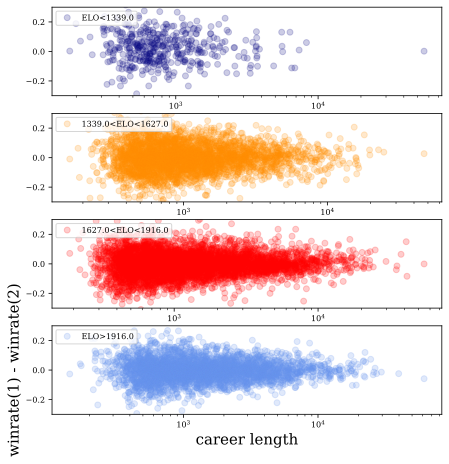

In [346]:

#------------------------------------------------------
bins_=101

colors = ['navy', 'darkorange','red', 'cornflowerblue']


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=bins_
fig = plt.figure(0,figsize=(7, 7.5));

store_for_test=[]
LINES_=['-.','--','-']
LINES_=['-']
CAREER_LEN_bins_=[200,2000,15000]
# CAREER_LEN_bins_=[100,10000]


labels_=[str(round(ELO_bins_[x],0))+'<ELO<'+str(round(ELO_bins_[x+1],0)) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(round(ELO_bins_[1],0))
labels_[len(labels_)-1]='ELO>'+str(round(ELO_bins_[len(ELO_bins_)-2],0))

it_career_len=0

# ax = fig.add_subplot(1, 1,1);

for it_bin in range(len(ELO_bins_)-1):
    ax = fig.add_subplot(len(ELO_bins_)-1, 1, it_bin+1);


    line_stlye=LINES_[it_career_len]
    
    high_ind=np.where((player_elo_FILTER_suboptimal[str(game_type_)]>ELO_bins_[it_bin])\
                      &(player_elo_FILTER_suboptimal[str(game_type_)]<ELO_bins_[it_bin+1])\
                      &(player_elo_FILTER_suboptimal[str(game_type_)]>-1)\
                      &(player_op_c_suboptimal[str(game_type_)]['op'+str(1)]>50)\
                      &(player_op_c_suboptimal[str(game_type_)]['op'+str(2)]>50)\
                      &(player_op_w_suboptimal[str(game_type_)]['op'+str(1)]>-1)\
                      &(player_op_w_suboptimal[str(game_type_)]['op'+str(2)]>-1)\
                      &(frac_diff2and1[str(game_type_)]>=.05))

    high_ind=high_ind[0]
    Y=WINRATE_DIFF[str(game_type_)][high_ind]
    X=player_num_op_FILTER[str(game_type_)][high_ind]
    store_for_test.append(X)
    X=X.reshape(-1, 1)
    Y=Y.reshape(-1, 1)
    p_=ax.plot(X,Y,'o',color=colors[it_bin],alpha=.2,label=labels_[it_bin]);
#     ax.set_yscale('log');
    ax.set_xscale('log');
    ax.set_ylim([-.3,.3]);
    ax.legend(loc='upper left');

    
# ax.set(ylabel=r' , w', xlabel=r'career length');

ax.set_xlabel(r"career length",fontsize=15);
ax.set_ylabel(r"winrate(1) - winrate(2)",fontsize=15);


    

for it_bin in range(len(ELO_bins_)-2):
    print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
it_bin=0
print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
          stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))




## Global popularity of openings
vs local popularity

In [521]:
won_

array([1., 0.])

In [515]:
game_type_=2
ind_relevant__=np.where(player_elo_FILTER_suboptimal[str(game_type_)]>-1);
X=player_elo_FILTER_suboptimal[str(game_type_)][ind_relevant__[0]];
ELO_bins_= get_ELO_bins(game_type_,X)



[0 1 1 1 1 1 1 1 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 1 1 0 0 0 0 0 1 1 1 0 1
 0 0 1 0 0 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 1 1 0 0 0 1 1 0 0 0 0
 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 1 0 0 0 1 1
 1 1 1 1 0 1 0 1 0 0]


## HOT-STREAKS

In [10]:
career_in_focus=len(career_indices)
# career_in_focus=41
# career_in_focus=100000

t_ic = time.time();
from collections import Counter

with open(path_dicts+'game_won_.pkl', 'rb') as f:
    store_who_won_= pickle.load(f)
store_who_won_=np.array(store_who_won_)

#----------------------------------------------
#----------------------------------------------
player_hot_streak_lengths={'1':[],'2':[],'3':[]}
player_elo_FILTER_hot_streaks={'1':[],'2':[],'3':[]}
player_hot_streak_career_stage={'1':[],'2':[],'3':[]}
player_hot_streak_lengths_shuff={'1':[],'2':[],'3':[]}
player_elo_FILTER_hot_streaks_shuff={'1':[],'2':[],'3':[]}
player_hot_streak_career_stage_shuff={'1':[],'2':[],'3':[]}

list_types=['Bullet','Blitz','Rapid','Standard','Correspondence'];


for it in range(career_in_focus-1):

    ind0=career_indices[it]+1
    ind1=career_indices[it+1]+1
    type_=game_type_simplified_numeric[ind0:ind1]
    ops_=store_op_mains[ind0:ind1]
    ops_vari=store_all_OPENINGS_variations[ind0:ind1]
    elos_=store_all_ELOs[ind0:ind1]
    is_white=store_is_white[ind0:ind1]
    won_=store_who_won_[ind0:ind1]
    
    for game_type_ in [1,2,3]:         
        key_=str(game_type_)
        ind_relevant=np.where((type_==game_type_)&(elos_>-1)); # hot-streak contain games with black as well
        LL_=ind_relevant[0].shape[0]
        
        if LL_>120:
            ind_relevant_elo=np.where((type_==game_type_)&(elos_>-1) & (is_white==1)); # for elo calc, only consider games as white

            ind_relevant=ind_relevant[100:]
            ops_=store_op_mains[ind0:ind1]
#             wins_=(won_[ind_relevant]==1).astype(int) ## only wins are counted in win streak, DRAW = LOSS
            wins_=(won_[ind_relevant]>0).astype(int) ## only wins are counted in win streak, DRAW = part of win streak
            elos_hot=elos_[ind_relevant]
            
            ind_temp=(wins_[0:wins_.shape[0]-1]-wins_[1:wins_.shape[0]])
            
            ind01=np.where(ind_temp==-1)[0]
            ind10=np.where(ind_temp==1)[0]
            LL__hot=min(ind10.shape[0],ind01.shape[0])
            elo_hot=np.mean(elos_hot)
            if wins_[0]==1:
                hot_L=ind10[1:LL__hot]-ind01[0:LL__hot-1]
                it_ll_=0
                for ll_ in hot_L:                    
                    player_elo_FILTER_hot_streaks[key_].append(elo_hot)
                    player_hot_streak_lengths[key_].append(ll_)
                    player_hot_streak_career_stage[key_].append(ind01[it_ll_])
                    it_ll_=it_ll_+1
            else:
                hot_L=ind10[0:LL__hot]-ind01[0:LL__hot]
                it_ll_=0
                for ll_ in hot_L:
                    player_elo_FILTER_hot_streaks[key_].append(elo_hot)
                    player_hot_streak_lengths[key_].append(ll_)
                    player_hot_streak_career_stage[key_].append(ind01[it_ll_])
                    it_ll_=it_ll_+1

# shuffling the win and losses of the player            
            wins__shuffled=np.random.permutation(wins_)
            ind_temp=(wins__shuffled[0:wins__shuffled.shape[0]-1]-wins__shuffled[1:wins__shuffled.shape[0]])
            
            ind01=np.where(ind_temp==-1)[0]
            ind10=np.where(ind_temp==1)[0]
            LL__hot=min(ind10.shape[0],ind01.shape[0])
            elo_hot=np.mean(elos_hot)
            if wins__shuffled[0]==1:
                hot_L=ind10[1:LL__hot]-ind01[0:LL__hot-1]
                it_ll_=0
                for ll_ in hot_L:                    
                    player_elo_FILTER_hot_streaks_shuff[key_].append(elo_hot)
                    player_hot_streak_lengths_shuff[key_].append(ll_)
                    player_hot_streak_career_stage_shuff[key_].append(ind01[it_ll_])
                    it_ll_=it_ll_+1
            else:
                hot_L=ind10[0:LL__hot]-ind01[0:LL__hot]
                it_ll_=0
                for ll_ in hot_L:
                    player_elo_FILTER_hot_streaks_shuff[key_].append(elo_hot)
                    player_hot_streak_lengths_shuff[key_].append(ll_)
                    player_hot_streak_career_stage_shuff[key_].append(ind01[it_ll_])
                    it_ll_=it_ll_+1

   

    if it % 10000 == 0:
        t_oc = time.time();
        print('career number=''--'+str(it/(career_in_focus-1))+'--i.e.-'+str(it)+'/'+str(career_in_focus-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'',end='\r')
        with open("/mnt/sdb1/sandeep/0. Careers in chess/a_entropy_calc.txt", "a") as file_object:
            file_object.write('--'+str(it/(len(career_indices)-1))+'--i.e.-'+str(it)+'/'+str(len(career_indices)-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'\n')


            

# #------------------------------------------------
# # Saving the analysis
# #------------------------------------------------
player_elo_FILTER_hot_streaks={x:np.array(player_elo_FILTER_hot_streaks[x]) for x in player_elo_FILTER_hot_streaks.keys()}
player_hot_streak_lengths={x:np.array(player_hot_streak_lengths[x]) for x in player_hot_streak_lengths.keys()}
player_elo_FILTER_hot_streaks_shuff={x:np.array(player_elo_FILTER_hot_streaks_shuff[x]) for x in player_elo_FILTER_hot_streaks_shuff.keys()}
player_hot_streak_lengths_shuff={x:np.array(player_hot_streak_lengths_shuff[x]) for x in player_hot_streak_lengths_shuff.keys()}


# with open(path_dicts+'player_elo_FILTER_hot_streaks.pkl', 'wb') as f:
#     pickle.dump(player_elo_FILTER_hot_streaks, f)

# with open(path_dicts+'player_hot_streak_lengths.pkl', 'wb') as f:
#     pickle.dump(player_hot_streak_lengths, f)

# with open(path_dicts+'player_hot_streak_career_stage.pkl', 'wb') as f:
#     pickle.dump(player_hot_streak_career_stage, f)

## Plotting hot-streaks 


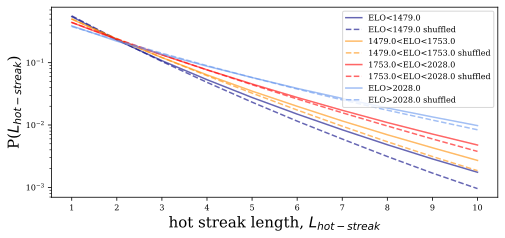

In [11]:
#------------------------------------------------------
bins_=101
op_considered=1

colors = ['navy', 'darkorange','red', 'cornflowerblue']


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=bins_
fig = plt.figure(0,figsize=(8, 3.5));

store_for_test=[]
LINES_=['-.','--','-']
LINES_=['-']
# CAREER_LEN_bins_=[100,500,2000,10000]
# CAREER_LEN_bins_=[100,10000]

game_type_=2
ind_relevant__=np.where(player_elo_FILTER_hot_streaks[str(game_type_)]>-1);
X=player_elo_FILTER_hot_streaks[str(game_type_)][ind_relevant__[0]];
ELO_bins_= get_ELO_bins(game_type_,X)


labels_=[str(round(ELO_bins_[x],0))+'<ELO<'+str(round(ELO_bins_[x+1],0)) for x in range(len(ELO_bins_)-1)]
labels_[0]='ELO<'+str(round(ELO_bins_[1],0))
labels_[len(labels_)-1]='ELO>'+str(round(ELO_bins_[len(ELO_bins_)-2],0))

it_career_len=0

op_considered_lab=['','2nd']
ax = fig.add_subplot(1, 1,1);

for it_bin in range(len(ELO_bins_)-1):

    line_stlye=LINES_[it_career_len]
    high_ind=np.where((player_elo_FILTER_hot_streaks[str(game_type_)]>ELO_bins_[it_bin])\
                      &(player_elo_FILTER_hot_streaks[str(game_type_)]<ELO_bins_[it_bin+1])\
                      &(player_elo_FILTER_hot_streaks[str(game_type_)]>-1))
#                       &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
#                       &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
    high_ind=high_ind[0]
    max_hot=11
    X=player_hot_streak_lengths[str(game_type_)][high_ind]
    X=X[X<max_hot]
    store_for_test.append(X)
    X=X.reshape(-1, 1)

    d = np.diff(np.unique(X)).min()
    left_of_first_bin = X.min() - float(d)/2
    right_of_last_bin = X.max() + float(d)/2
    counts, bin_edges = np.histogram(X, bins=np.arange(left_of_first_bin, right_of_last_bin + d, d),density=True)
#     ax.hist(X, np.arange(left_of_first_bin, right_of_last_bin + d, d),color=colors[it_bin],label=labels_[it_bin],alpha=.6,density=True)
    xxxx=(bin_edges[0:bin_edges.shape[0]-1]+bin_edges[1:bin_edges.shape[0]])/2
    ax.plot(xxxx,counts,color=colors[it_bin],label=labels_[it_bin],alpha=.6)

    
    
    
#PLOTTING shuffled hot-streaks
    high_ind=np.where((player_elo_FILTER_hot_streaks_shuff[str(game_type_)]>ELO_bins_[it_bin])\
                      &(player_elo_FILTER_hot_streaks_shuff[str(game_type_)]<ELO_bins_[it_bin+1])\
                      &(player_elo_FILTER_hot_streaks_shuff[str(game_type_)]>-1))
#                       &(player_num_op_FILTER[str(game_type_)]>CAREER_LEN_bins_[it_career_len])\
#                       &(player_num_op_FILTER[str(game_type_)]<CAREER_LEN_bins_[it_career_len+1]));
    high_ind=high_ind[0]
    max_hot=11
    X=player_hot_streak_lengths_shuff[str(game_type_)][high_ind]
    X=X[X<max_hot]
    store_for_test.append(X)
    X=X.reshape(-1, 1)

    d = np.diff(np.unique(X)).min()
    left_of_first_bin = X.min() - float(d)/2
    right_of_last_bin = X.max() + float(d)/2
    counts, bin_edges = np.histogram(X, bins=np.arange(left_of_first_bin, right_of_last_bin + d, d),density=True)
#     ax.hist(X, np.arange(left_of_first_bin, right_of_last_bin + d, d),color=colors[it_bin],label=labels_[it_bin],alpha=.6,density=True)
    xxxx=(bin_edges[0:bin_edges.shape[0]-1]+bin_edges[1:bin_edges.shape[0]])/2
    ax.plot(xxxx,counts,'--',color=colors[it_bin],label=labels_[it_bin]+' shuffled',alpha=.6)


    
#     plt.show()
    #         print(len(X))
#         p_=ax.hist(X,bins_,alpha=.3,density=True,color=colors[it_bin]);

#     kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(X)
#     s = np.arange(1,15)
#     log_dens = kde.score_samples(s.reshape(-1,1))
#     ax.plot(s,np.exp(log_dens),line_stlye,color=colors[it_bin],label=labels_[it_bin])


ax.set_xlabel(r"hot streak length, $L_{hot-streak}$",fontsize=15)
ax.set_ylabel(r'P($L_{hot-streak}$)',fontsize=15)
ax.set_xticks(np.arange(1,max_hot))
ax.set_yscale('log');

# for it_bin in range(len(ELO_bins_)-2):
#     print(labels_[it_bin]+' vs '+ labels_[it_bin+1],'\n',
#           stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+1]))
# it_bin=0
# print(labels_[it_bin]+' vs '+ labels_[it_bin+2],'\n',
#           stats.ks_2samp(store_for_test[it_bin],store_for_test[it_bin+2]))

ax.legend(loc='upper right');



# Repeated interactions

In [34]:
with open(path_dicts+'store_player_id_black_.pkl', 'rb') as f:
    store_player_id_black_= pickle.load(f)
    
with open(path_dicts+'store_player_id_white_.pkl', 'rb') as f:
    store_player_id_white_= pickle.load(f)
    

In [103]:
dict_repeated=dict()
t_ic = time.time();
career_in_focus=store_player_id_black_.shape[0]
# career_in_focus=10000000
for it_game in range(career_in_focus):
#     key_=store_player_id_black_[it_game]+'__vs_versus_vs__'+store_player_id_white_[it_game]
    key_2=store_player_id_white_[it_game]+'|'+store_player_id_black_[it_game]
    
#     if key_ in dict_repeated.keys():
#         dict_repeated[key_]=dict_repeated[key_]+1
    if key_2 in dict_repeated.keys():
        dict_repeated[key_2]=dict_repeated[key_2]+1
    else:
        dict_repeated[key_2]=1
    if it_game % 10000 == 0:
        t_oc = time.time();
        print('career number=''--'+str(it_game/(career_in_focus-1))+'--i.e.-'+str(it_game)+'/'+str(career_in_focus-1)+'----time (s)-'+str(round(t_oc-t_ic,2))+'',end='\r')

    

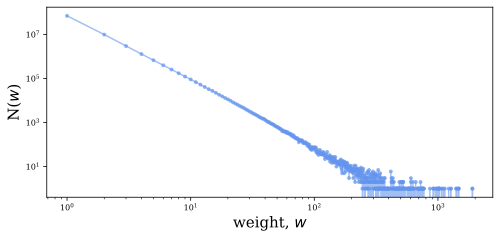

In [122]:
#------------------------------------------------------
bins_=101
op_considered=1

colors = ['navy', 'darkorange','red', 'cornflowerblue']


# labels_ = ['ELO < 1500', '1500 < ELO < 1800 ', 'ELO > 1800']

nn=bins_
fig = plt.figure(0,figsize=(8, 3.5));



ax = fig.add_subplot(1, 1,1);

X=np.array(list(dict_repeated.values()))/2

d = np.diff(np.unique(X)).min()
left_of_first_bin = X.min() - float(d)/2
right_of_last_bin = X.max() + float(d)/2
# counts, bin_edges = np.histogram(X, bins=np.arange(left_of_first_bin, right_of_last_bin + d, d),density=True)
counts, bin_edges = np.histogram(X, bins=np.arange(left_of_first_bin, right_of_last_bin + d, d),density=False)
#     ax.hist(X, np.arange(left_of_first_bin, right_of_last_bin + d, d),color=colors[it_bin],label=labels_[it_bin],alpha=.6,density=True)
xxxx=(bin_edges[0:bin_edges.shape[0]-1]+bin_edges[1:bin_edges.shape[0]])/2
ax.plot(xxxx,counts,'.-',color=colors[it_bin],alpha=.6)



ax.set_xlabel(r"number of games, $x$",fontsize=15)
ax.set_ylabel(r'number of pairs of players with $x$ games',fontsize=15)
ax.set_xlabel(r"weight, $w$",fontsize=15)
ax.set_ylabel(r'N($w$)',fontsize=15)
# ax.set_xticks(np.arange(1,max_hot))
ax.set_yscale('log');
ax.set_xscale('log');




In [116]:
y=[len(x) for x in store_player_id_white_[0:100000000]]
y=np.array(y)
sum(['|' in x for x in store_player_id_white_[np.where(y>1)]])


0

## Repeated opponent vs hot-streak length prior to match up
Is a player more likely to win agaist same opponent if he/she is on a winning-streak of length L?

In [14]:
# with open(path_dicts+'store_is_white.pkl', 'rb') as f:
#     store_is_white= pickle.load(f)
    

In [35]:
# import numpy as np
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

# # Create the data
# rs = np.random.RandomState(1979)
# x = rs.randn(500)
# g = np.tile(list("ABCDEFGHIJ"), 50)
# df = pd.DataFrame(dict(x=x, g=g))
# m = df.g.map(ord)
# df["x"] += m

# # Initialize the FacetGrid object
# pal = sns.cubehelix_palette(5, rot=-.25, light=.7)
# g = sns.FacetGrid(df_elos, row="game_type", hue="game_type", aspect=15, height=.5, palette=pal)
# # g = sns.FacetGrid(df_elos, row="game_type")



# # Draw the densities in a few steps
# g.map(sns.histplot, "elos")


# # ,, binwidth=2, binrange=(0, 60)
# #       bw_adjust=.5, clip_on=False,
# #       fill=True, alpha=1, linewidth=1.5)
# # g.map(sns.kdeplot, "x", clip_on=False, color="w", lw=2, bw_adjust=.5)

# # # passing color=None to refline() uses the hue mapping
# # g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


# # # Define and use a simple function to label the plot in axes coordinates
# # def label(x, color, label):
# #     ax = plt.gca()
# #     ax.text(0, .2, label, fontweight="bold", color=color,
# #             ha="left", va="center", transform=ax.transAxes)


# # g.map(label, "x")

# # # Set the subplots to overlap
# # g.figure.subplots_adjust(hspace=-.25)

# # # Remove axes details that don't play well with overlap
# # g.set_titles("")
# # g.set(yticks=[], ylabel="")
# # g.despine(bottom=True, left=True)

In [ ]:
# #------------------------------------------------
# # Saving the analysis
# #------------------------------------------------
# with open(path_dicts+'dict_opening_variations_numeric_map.pkl', 'wb') as f:
#     pickle.dump(dict_opening_variations_numeric_map, f)

# with open(path_dicts+'list_store_all_OPENINGS_variations_numeric.pkl', 'wb') as f:
#     pickle.dump(list_store_all_OPENINGS_variations_numeric, f)

### do certain openings promote longer games in weaker players? 
Supplementary fig

In [540]:
p=Pool(processes=15)
names=path_dicts+"parquets/a_sorted_full_careers*"

# names=path_dicts+"parquets/dict_full_careers*" # all files
files=sorted(glob.glob(names))
df_careers = pd.concat(p.map(pd.read_parquet,files),ignore_index=True)
# df_careers = pd.read_parquet(names)

print('loaded careers=',toc(start_time))


p.close()

1384086.725333482
loaded careers= None


In [541]:
df_careers

,player_id,event_type,time_control,white_player,black_player,result_,utcdate,utctime,whiteelo,blackelo,opening_,actual_game_,termination_,is_white,won_
0,-1,Rated Blitz game,300+2,-1,JoseChez,0-1,2013-01-01 13:59:17,13:59:17,1557,1338,Pirc Defense #4,1. e4 d6 2. Bc4 Nf6 3. d3 g6 4. Bg5 Bg7 5. h4 ...,Normal,1,0.0
1,-1,Rated Blitz game,300+2,-1,WealthandTaste,0-1,2013-01-01 14:09:42,14:09:42,1538,1394,Robatsch (Modern) Defense,1. e4 g6 2. d4 Bg7 3. e5 e6 4. Nf3 b6 5. Bg5 f...,Normal,1,0.0
2,-1,Rated Blitz game,300+2,-1,alex296,1-0,2013-01-01 14:21:30,14:21:30,1522,1302,"Italian Game: Classical Variation, Giuoco Pian...",1. e4 e5 2. Bc4 Nc6 3. d3 Nf6 4. c3 Bc5 5. Nf3...,Normal,1,1.0
3,-1,Rated Blitz game,300+2,-1,jemioloch,1-0,2013-01-02 15:42:50,15:42:50,1528,1200,Bishop's Opening,1. e4 e5 2. Bc4 Qe7 3. d3 d6 4. Nf3 Be6 5. h3 ...,Normal,1,1.0
4,-1,Rated Blitz game,300+2,-1,jmcd,0-1,2013-01-02 15:49:35,15:49:35,1531,1417,King's Pawn Game,1. e4 e5 0-1\n,Time forfeit,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246158051,zwzdhwd,Rated Bullet game,30+0,zwzdhwd,aleks63,0-1,2016-12-31 19:17:16,19:17:16,1665,2103,Pirc Defense #4,1. e4 d6 2. Nf3 Nf6 3. Bc4 e6 4. Bb3 Nxe4 5. d...,Time forfeit,1,0.0
246158052,zwzdhwd,Rated Bullet game,30+0,zwzdhwd,aleks63,0-1,2016-12-31 19:18:49,19:18:49,1658,2105,Van't Kruijs Opening,1. e3 d6 2. d4 Nf6 3. Nc3 g6 4. Bb5+ c6 5. Bd3...,Normal,1,0.0
246158053,zx3t,Rated Blitz game,180+0,zx3t,CHEMENGER,1-0,2016-12-31 15:44:45,15:44:45,1500,1507,Petrov's Defense,1. e4 { [%eval 0.23] } 1... e5 { [%eval 0.31] ...,Normal,1,1.0
246158054,zx3t,Rated Blitz game,180+0,zx3t,zzzllzzz,0-1,2016-12-31 16:31:34,16:31:34,1678,1738,Caro-Kann Defense,1. e4 c6 2. Nf3 d5 3. exd5 cxd5 4. d4 Nf6 5. N...,Normal,1,0.0


In [542]:
store_player_id_white_=np.array(df_careers['white_player'])
store_player_id_black_=np.array(df_careers['black_player'])


In [545]:
store_utcdate_game=np.array(df_careers['utcdate'])
store_utctime_game=np.array(df_careers['utctime'])

Finding career start and ends within the dataframe

In [8]:
store_is_white=np.array(df_careers['is_white'])
# ids=np.array(df_careers['player_id'])
# ind=np.where(~(ids[1:ids.shape[0]]==ids[0:ids.shape[0]-1]))
# ind=ind[0]
# career_lens=ind[1:len(ind)]-ind[0:len(ind)-1]
# print(sum(np.array(career_lens)>100))
# ind=[0]+list(ind)
# career_indices=ind
# len(ind)

In [546]:
# store_elo_gap_white_minus_black=np.array(list(df_careers['whiteelo']-df_careers['blackelo']))
#------------------------------------------------
# Saving the analysis
#------------------------------------------------
with open(path_dicts+'store_utcdate_game.pkl', 'wb') as f:
    pickle.dump(store_utcdate_game, f)
with open(path_dicts+'store_utctime_game.pkl', 'wb') as f:
    pickle.dump(store_utctime_game, f)


In [11]:
store_is_white.shape

(246158056,)

In [13]:
np.sum(store_is_white)

123080062

In [ ]:
#set_op=set(list_all_OPENINGS_variations)
# with open(path_dicts+'dict_opening_variations_numeric_map.pkl', 'rb') as f:
# #     dict_opening_variations_numeric_map= pickle.load(f)
# dict_opening_variations_numeric_map={}
# it=-1
# for x in set_op:
#     it=it+1
#     dict_opening_variations_numeric_map[x]=it
# list_store_all_OPENINGS_variations_numeric=[dict_opening_variations_numeric_map[x] for x in list_all_OPENINGS_variations]
# list_store_all_OPENINGS_variations_numeric=np.array(list_store_all_OPENINGS_variations_numeric)